# Oranges case

In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
from pathlib import Path
import sys
import os

source_dir = str(Path.cwd().parent)
if source_dir not in sys.path:
    sys.path.append(source_dir)

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit # https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html

from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.diagnostics import cross_validation, performance_metrics

import itertools

pd.options.display.float_format = '{:,.2f}'.format

from oranges_case_lab.configs import config as cf
from oranges_case_lab.constants import constants as cnst
from oranges_case_lab.utils import prophet_dafaframe, show_interactive_plot, plot_train_test_pred, plot_forecast

In [21]:
# loading both prices and GoogleData csv files
prices_orig = pd.read_csv(os.path.join(cnst.DATASETS_DIR, "prices.csv"))
google_orig = pd.read_csv(os.path.join(cnst.DATASETS_DIR, "GoogleData_oranges.csv"))

## Analysis of the datasets

### Data analysis - prices dataset

In [22]:
# overview of the prices dataset structure, its head
prices_orig.head()

,Date,AveragePrice,TotalVolume,4046,4225,4770,TotalBags,SmallBags,LargeBags,XLargeBags,type,year,region
0,2015-01-04,1.22,"40,873.28","2,819.50","28,287.42",49.90,"9,716.46","9,186.93",529.53,0.00,conventional,2015,Albany
1,2015-01-04,1.00,"435,021.49","364,302.39","23,821.16",82.15,"46,815.79","16,707.15","30,108.64",0.00,conventional,2015,Atlanta
2,2015-01-04,NaN,"788,025.06","53,987.31","552,906.04","39,995.03","141,136.68","137,146.07","3,990.61",0.00,conventional,2015,BaltimoreWashington
3,2015-01-04,1.01,"80,034.32","44,562.12","24,964.23","2,752.35","7,755.62","6,064.30","1,691.32",0.00,conventional,2015,Boise
4,2015-01-04,1.02,"491,738.00","7,193.87","396,752.18",128.82,"87,663.13","87,406.84",256.29,0.00,conventional,2015,Boston


In [5]:
# basic info of the prices dataset
prices_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25161 entries, 0 to 25160
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          25161 non-null  object 
 1   AveragePrice  24259 non-null  float64
 2   TotalVolume   24212 non-null  float64
 3   4046          24261 non-null  float64
 4   4225          24255 non-null  float64
 5   4770          24245 non-null  float64
 6   TotalBags     24271 non-null  float64
 7   SmallBags     24227 non-null  float64
 8   LargeBags     24214 non-null  float64
 9   XLargeBags    24293 non-null  float64
 10  type          25161 non-null  object 
 11  year          25161 non-null  int64  
 12  region        25161 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 2.5+ MB


In [6]:
# changing the datatype of the date column
prices_orig = prices_orig.astype({'Date': 'datetime64[ns]'})

In [7]:
# prices dataset overview
prices_orig.describe(include="all")

/Users/radimmusalek/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  


,Date,AveragePrice,TotalVolume,4046,4225,4770,TotalBags,SmallBags,LargeBags,XLargeBags,type,year,region
count,25161,"24,259.00","24,212.00","24,261.00","24,255.00","24,245.00","24,271.00","24,227.00","24,214.00","24,293.00",25161,"25,161.00",25161
unique,233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,54
top,2016-10-23 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,conventional,NaN,Southeast
freq,108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12582,NaN,466
first,2015-01-04 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2019-07-14 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1.40,"917,091.34","298,153.02","295,828.43","22,463.62","295,043.21","212,419.88","75,899.24","4,405.64",NaN,"2,016.78",NaN
std,NaN,0.38,"3,731,937.46","1,288,583.40","1,209,444.82","104,662.07","1,232,967.42","869,304.26","358,607.93","25,806.50",NaN,1.32,NaN
min,NaN,0.44,84.56,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,"2,015.00",NaN
25%,NaN,1.11,"13,234.04",822.59,"3,061.14",0.00,"7,319.51","4,770.44",235.82,0.00,NaN,"2,016.00",NaN


#### Prices of conventional type

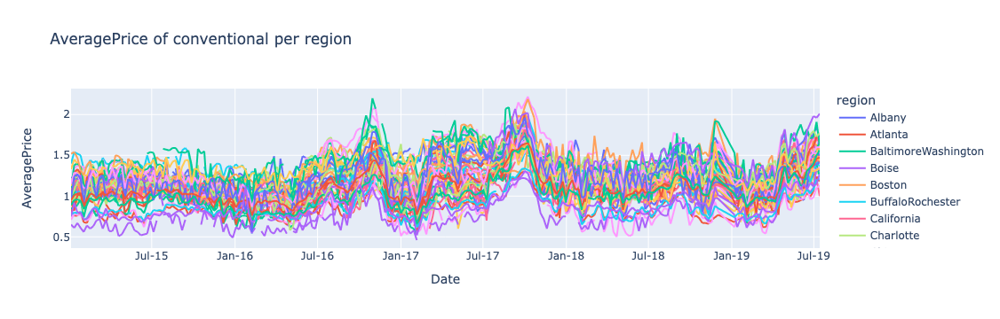

In [8]:
show_interactive_plot(pandas_dataframe=prices_orig, y_column="AveragePrice", product_type="conventional")

**Key points:**
- Price spikes in the Oct-Nov period in the more recent years
- Significant increase in the recent months
- All regions seem to fit within approx. 1 USD range during the past

#### Prices of organic type

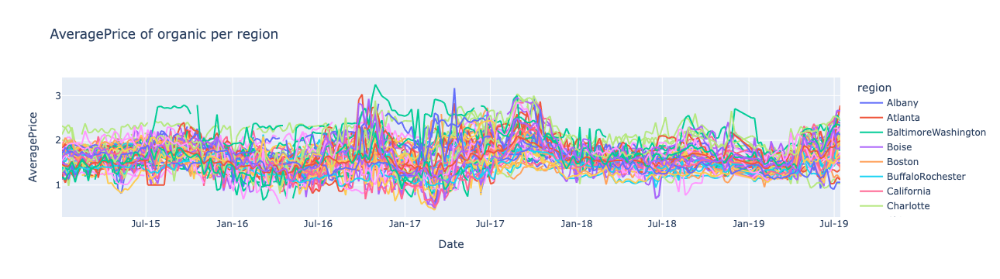

In [9]:
show_interactive_plot(pandas_dataframe=prices_orig, y_column="AveragePrice", product_type="organic")

**Key points**
- less structured than the price of conventional oranges
- San Francisco gets often high peaks which aren't followed in other regions
- it seems to be less seasonal driven than conventional orange prices

#### Volumes of conventional type

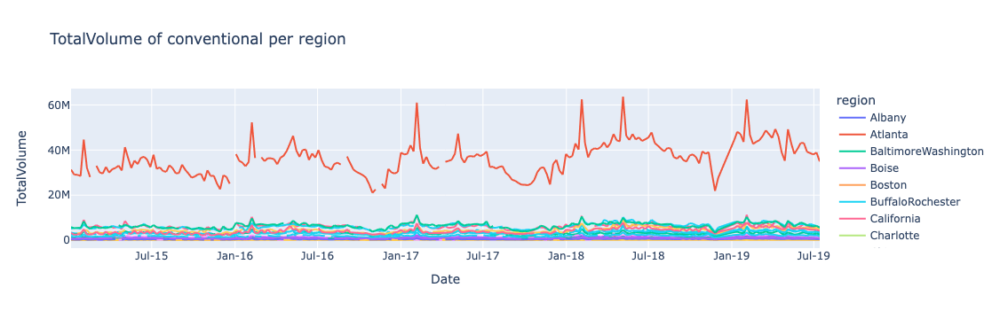

In [10]:
show_interactive_plot(pandas_dataframe=prices_orig, y_column="TotalVolume", product_type="conventional")

**Key points**
- significant peaks in Feb and May across all major regions
- TotalUS is the biggest "region" so despite of the other regions are majority we should still include TotalUS in our models
- slight upward trend in total volumes

#### Volumes of organic type

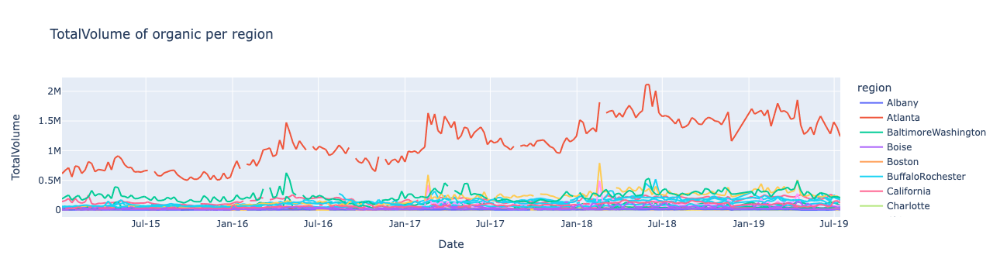

In [11]:
show_interactive_plot(pandas_dataframe=prices_orig, y_column="TotalVolume", product_type="organic")

**Key points**
- magnitude smaller volumes than conventional oranges
- significant upward trend in the past, though flattened in 2019
- less pronounced seasonal trends
- similar to the conventional type, the TotalUS is the region with the largest volumes
- the whole US total volumes are driven mostly by a few regions (TotalUS, West, Northeast, New York, Great Lakes) and these regions aren't all the same as in the conventional type

### Data analysis - Google dataset

In [12]:
# overview of the Google dataset structure, its head
google_orig.head()

,Unnamed: 0,oranges: (United States),organic: (United States),oranges recipe: (United States),oranges smoothie: (United States),oranges salad: (United States),organic oranges: (United States)
0,2015-01-04,46,76,84,8,51,10
1,2015-01-11,48,79,76,8,38,29
2,2015-01-18,48,82,84,9,66,27
3,2015-01-25,49,82,89,8,44,28
4,2015-02-01,52,81,82,7,46,42


In [13]:
# basic info about the Google dataset
google_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239 entries, 0 to 238
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   Unnamed: 0                         239 non-null    object
 1   oranges: (United States)           239 non-null    int64 
 2   organic: (United States)           239 non-null    int64 
 3   oranges recipe: (United States)    239 non-null    int64 
 4   oranges smoothie: (United States)  239 non-null    int64 
 5   oranges salad: (United States)     239 non-null    int64 
 6   organic oranges: (United States)   239 non-null    int64 
dtypes: int64(6), object(1)
memory usage: 13.2+ KB


In [14]:
# changing the datatype of the date column
google_orig = google_orig.astype({"Unnamed: 0": "datetime64[ns]"})

In [15]:
# Google dataset overview
google_orig.describe(include="all", datetime_is_numeric=True)

,Unnamed: 0,oranges: (United States),organic: (United States),oranges recipe: (United States),oranges smoothie: (United States),oranges salad: (United States),organic oranges: (United States)
count,239,239.00,239.00,239.00,239.00,239.00,239.00
mean,2017-04-16 00:00:00,52.31,82.50,66.99,32.71,50.18,36.06
min,2015-01-04 00:00:00,29.00,56.00,33.00,7.00,15.00,10.00
25%,2016-02-24 12:00:00,44.50,79.00,55.00,15.00,42.00,27.00
50%,2017-04-16 00:00:00,52.00,83.00,68.00,30.00,50.00,35.00
75%,2018-06-06 12:00:00,60.00,87.00,78.50,50.50,59.00,44.50
max,2019-07-28 00:00:00,100.00,100.00,100.00,100.00,100.00,100.00
std,NaN,11.29,6.85,14.84,19.54,12.26,12.70


In [16]:
# renaming the columns to get more readable format
google_orig.columns = ["Date", "oranges", "organic",
       "oranges recipe", "oranges smoothie",
       "oranges salad", "organic oranges"]

#### Google searches per keyword

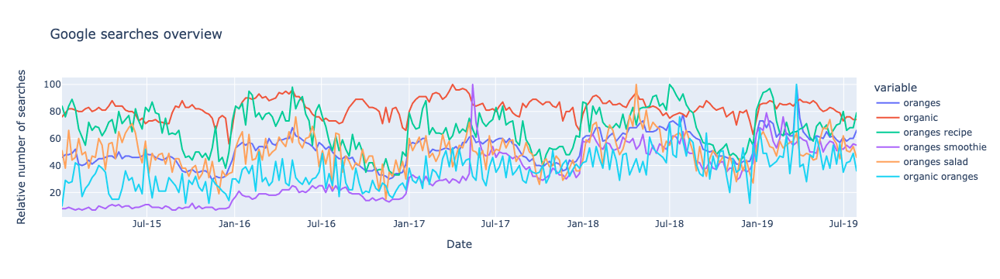

In [17]:
# interactive plot with G-searches per keyword over the time period
fig_google = px.line(google_orig, x="Date", y=google_orig.columns,
              title="Google searches overview", labels=dict(value="Relative number of searches"))
fig_google.update_xaxes(
    dtick="M6",
    tickformat="%b-%y")
fig_google.show()

**Key points**
- "oranges" search appears to be have seasonal trend with a significant drop from Sep till early Dec, one extraordinary peak in Mar-19
- "organic" search shows also seasonality trend with lows in Jun-Aug and Nov-Dec periods, hitting its lowest point regularly in Dec
- "oranges recipe" following similar trend to "orange", however with a greater week-to-week volatility
- "oranges smoothie" also shows minor seasonal trend with its lows in Q4s but with a clear upward trend since 2016
- "oranges salad" follow the "orange" search too (similarly to "orange recipe"), with a greater week-to-week volatility
- "organic oranges" doesn't seem to have a clear seasonality pattern, there's slight decrease in Q4 similar to the other searches, however, it's not as profound as in the other cases. On the other hand it shows high week-to-week volatility and a slight upward trend
- only "oranges" and "organic oranges" got the extraordinary peak in Mar-19 which doesn't show in the other searches

## Data cleaning and preprocessing

In [18]:
# split the prices dataset into organic and conventional type
prices_US_conv = prices_orig[prices_orig["type"]=="conventional"].reset_index(drop=True)
prices_US_org = prices_orig[prices_orig["type"]=="organic"].reset_index(drop=True)

In [19]:
# grouping the regional data of the conventional type oranges into whole US by Date
# AveragePrice is mean of its values, the other columns are summarised
prices_US_conv_group = prices_US_conv.groupby("Date").agg({"AveragePrice":"mean", # median would be better option here
                                                           "TotalVolume":"sum",
                                                           "4046":"sum",
                                                           "4225":"sum",
                                                           "4770":"sum",
                                                           "TotalBags":"sum",
                                                           "SmallBags":"sum",
                                                           "LargeBags":"sum",
                                                           "XLargeBags":"sum"
                                                          }).reset_index()

In [20]:
# same process as above done for the organic oranges data
prices_US_org_group = prices_US_org.groupby("Date").agg({"AveragePrice":"mean", # median would be better option here
                                                           "TotalVolume":"sum",
                                                           "4046":"sum",
                                                           "4225":"sum",
                                                           "4770":"sum",
                                                           "TotalBags":"sum",
                                                           "SmallBags":"sum",
                                                           "LargeBags":"sum",
                                                           "XLargeBags":"sum"
                                                          }).reset_index()

In [21]:
# merging of the both grouped data with the google searches data
# we keep all the columns of the google dataset for both merges
prices_US_conv_merged = prices_US_conv_group.merge(google_orig, how="left", on="Date")
prices_US_org_merged = prices_US_org_group.merge(google_orig, how="left", on="Date")

In [ ]:
# overview of the merged conventional dataset structure, its head
prices_US_conv_merged.head()

In [ ]:
# overview of the merged organic dataset structure, its head
prices_US_org_merged.head()

**Notes:**
- Left join is used as the most significant parameters for the prediction will be the price and volumes since those are the ones we're interested in for our model.
- One missing date for G-searches, no need to extrapolate since Prophet does not care, otherwise we could use e.g. mean of the values around that day

## Dataset split

In [24]:
# spitting the datasets on training part (till the end of 2018) and testing part (from beginning of 2019)
prices_US_conv_2015_2018 = prices_US_conv_merged[prices_US_conv_merged["Date"]<"2019-01-01"]
prices_US_conv_2019 = prices_US_conv_merged[prices_US_conv_merged["Date"]>="2019-01-01"]

prices_US_org_2015_2018 = prices_US_org_merged[prices_US_org_merged["Date"]<"2019-01-01"]
prices_US_org_2019 = prices_US_org_merged[prices_US_org_merged["Date"]>="2019-01-01"]

In [25]:
# double-check that the split is done correctly
print(prices_US_conv_2015_2018.iloc[-1][0])
print(prices_US_conv_2019.iloc[0][0])
print(prices_US_org_2015_2018.iloc[-1][0])
print(prices_US_org_2019.iloc[0][0])

2018-12-02 00:00:00
2019-01-07 00:00:00
2018-12-02 00:00:00
2019-01-07 00:00:00


## Model for price of conventional type

In [26]:
# simplifing the dataframe for use by Prophet
conv_P_df = prophet_dafaframe(prices_US_conv_2015_2018, 'Date', 'AveragePrice')

### Default model

In [27]:
# creating model with default values, skipping only the daily and weekly seasonality which isn't present in our data
model_conv_P_def = Prophet(daily_seasonality=False, weekly_seasonality=False)

In [28]:
# fitting the model on the whole training set
model_conv_P_def.fit(conv_P_df)

In [29]:
future_conv_P_def = model_conv_P_def.make_future_dataframe(periods=len(prices_US_conv_2019), freq="W")

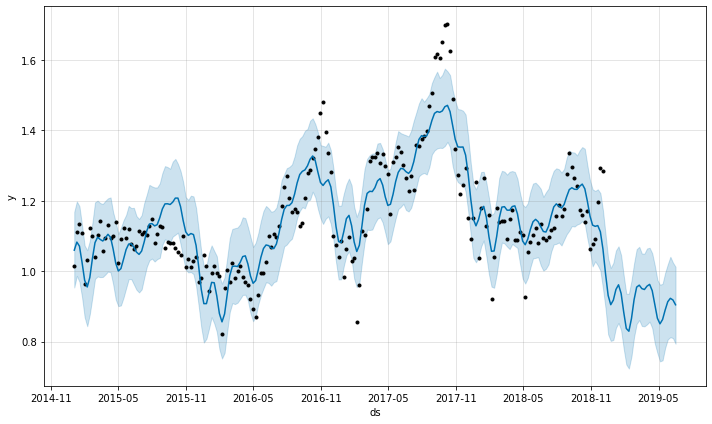

In [30]:
# forecast visualisation
forecast_conv_P_def = model_conv_P_def.predict(future_conv_P_def)
fig_conv_P_def = model_conv_P_def.plot(forecast_conv_P_def)

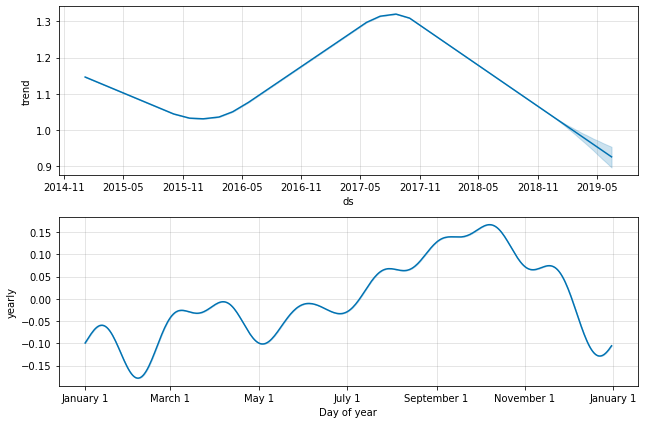

In [31]:
# model components visualisation
fig_conv_P_comp_def = model_conv_P_def.plot_components(forecast_conv_P_def)

In [32]:
# selecting only the test period forecast
pred_conv_P_2019_def = forecast_conv_P_def[forecast_conv_P_def["ds"]>"2019-01-01"][["ds", "yhat"]]

In [33]:
# simplifing the actuals dataframe for comparison
actuals_conv_P_2019_def = prices_US_conv_2019[["Date", "AveragePrice"]]
actuals_conv_P_2019_def.columns = ["ds", "y"]

In [34]:
# merging the prediction and actuals dataframes into one
conv_P_2019_def = actuals_conv_P_2019_def.merge(pred_conv_P_2019_def, on="ds")

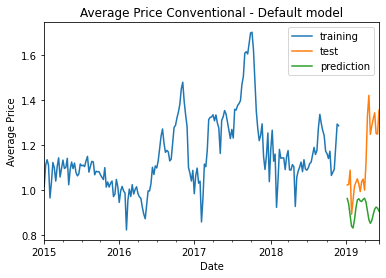

In [35]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=conv_P_df, test_pred_dataframe=conv_P_2019_def,
                    pred_parameter='Average Price', product_type='Conventional', model_type='Default')

In [36]:
# model's MAPE calculation
model_conv_P_def_MAPE = mean_absolute_percentage_error(conv_P_2019_def["y"], conv_P_2019_def["yhat"])

In [37]:
print("Default model MAPE: {:.2f}".format(model_conv_P_def_MAPE))

Default model MAPE: 0.18


### Model with hyperparameter tuning 

In [38]:
# cross-validation hyperparameters on the Prophet model
param_grid = {  
    "changepoint_prior_scale": [0.001, 0.01, 0.1, 0.5],
    "seasonality_prior_scale": [0.01, 0.1, 1.0, 10.0],
    "seasonality_mode": ["additive", "multiplicative"],
    "growth": ["linear", "flat"],
    "daily_seasonality": [False],
    "weekly_seasonality": [False]
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
mapes = []  # Store the MAPEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(conv_P_df)  # Fit model with given params
    df_cv_conv_P = cross_validation(m, initial="730 days", period="90 days", horizon="365 days", parallel="processes")
    df_p_conv_P = performance_metrics(df_cv_conv_P, rolling_window=1)
    mapes.append(df_p_conv_P["mape"].values[0])
    
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results["mape"] = mapes
print(tuning_results)

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb626d94d10>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb6278b9290>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb626d75690>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb626cf5990>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.proc

    changepoint_prior_scale  seasonality_prior_scale seasonality_mode  growth  \
0                      0.00                     0.01         additive  linear   
1                      0.00                     0.01         additive    flat   
2                      0.00                     0.01   multiplicative  linear   
3                      0.00                     0.01   multiplicative    flat   
4                      0.00                     0.10         additive  linear   
..                      ...                      ...              ...     ...   
59                     0.50                     1.00   multiplicative    flat   
60                     0.50                    10.00         additive  linear   
61                     0.50                    10.00         additive    flat   
62                     0.50                    10.00   multiplicative  linear   
63                     0.50                    10.00   multiplicative    flat   

    daily_seasonality  week

In [39]:
# selecting the best hyperparameters
best_params_conv_P = all_params[np.argmin(mapes)]
print(best_params_conv_P)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive', 'growth': 'flat', 'daily_seasonality': False, 'weekly_seasonality': False}


In [40]:
# creating the model with the best parameters
model_conv_P = Prophet(**best_params_conv_P)

In [41]:
# fitting the model on the whole training set
model_conv_P.fit(conv_P_df)

In [42]:
future_conv_P = model_conv_P.make_future_dataframe(periods=len(prices_US_conv_2019), freq="W")

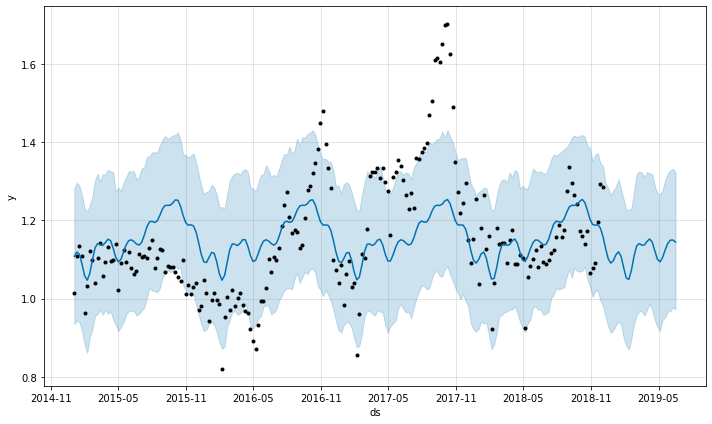

In [43]:
# forecast visualisation
forecast_conv_P = model_conv_P.predict(future_conv_P)
fig_conv_P = model_conv_P.plot(forecast_conv_P)

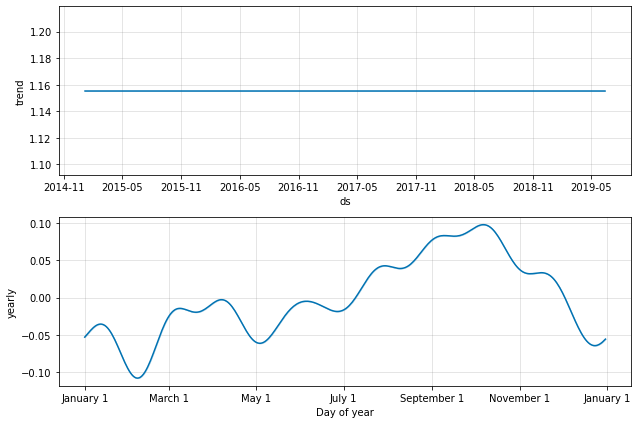

In [44]:
# model components visualisation
fig_conv_P_comp = model_conv_P.plot_components(forecast_conv_P)

In [45]:
# cross-validation of the selected model
df_cv_conv_P = cross_validation(model_conv_P, initial="730 days", period="90 days", horizon="365 days", parallel="processes")

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb626b082d0>


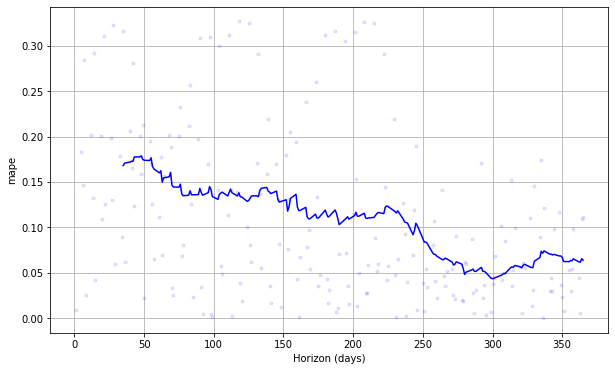

In [46]:
# MAPE of the cross-validated model visualisation
fig_conv_P_cv_mape = plot_cross_validation_metric(df_cv_conv_P, metric='mape')

In [47]:
# selecting only the test period forecast
pred_conv_P_2019 = forecast_conv_P[forecast_conv_P["ds"]>"2019-01-01"][["ds", "yhat"]]

In [48]:
# simplifing the actuals dataframe for comparison
actuals_conv_P_2019 = prices_US_conv_2019[["Date", "AveragePrice"]]
actuals_conv_P_2019.columns = ["ds", "y"]

In [49]:
# merging the prediction and actuals dataframes into one
conv_P_2019 = actuals_conv_P_2019.merge(pred_conv_P_2019, on="ds")

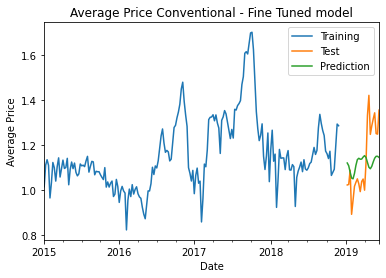

In [54]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=conv_P_df, test_pred_dataframe=conv_P_2019,
                    pred_parameter='Average Price', product_type='Conventional', model_type='Fine Tuned')

In [55]:
# model's MAPE calculation
model_conv_P_MAPE = mean_absolute_percentage_error(conv_P_2019["y"], conv_P_2019["yhat"])

In [56]:
# default vs. tuned models' MAPE
print("Default model MAPE: {:.2f}".format(model_conv_P_def_MAPE))
print("Tuned model MAPE: {:.2f}".format(model_conv_P_MAPE))

Default model MAPE: 0.18
Tuned model MAPE: 0.11


### Forecasting

In [57]:
# simplifing the full dataset for use by Prophet
conv_P_full = prices_US_conv_merged[["Date", "AveragePrice"]]
conv_P_full.columns = ["ds", "y"]

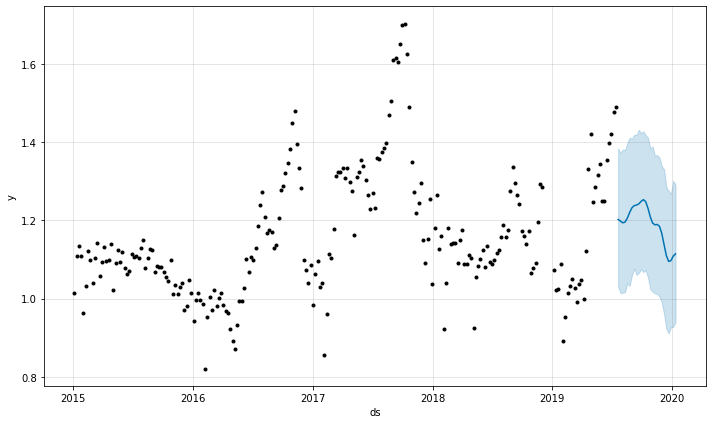

In [58]:
# re-training the model using the best performing parameters and full dataset
# creating 6-month forecast
model_conv_P_for = Prophet(**best_params_conv_P)
model_conv_P_for.fit(conv_P_full)
future_6m_conv_P = model_conv_P_for.make_future_dataframe(periods=26, freq="W", include_history=False)
forecast_6m_conv_P = model_conv_P_for.predict(future_6m_conv_P)
fig_6m_conv_P = model_conv_P_for.plot(forecast_6m_conv_P)

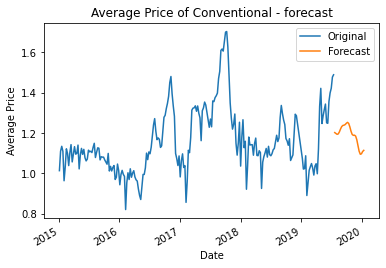

In [60]:
# plotting forecast
plot_forecast(original_dataframe=conv_P_full, forecast_dataframe=forecast_6m_conv_P,
              pred_parameter='Average Price', product_type='Conventional')

## Model for price of organic type

In [61]:
# simplifing the dataframe for use by Prophet
org_P_df = prices_US_org_2015_2018[["Date", "AveragePrice"]]
org_P_df.columns = ["ds", "y"]

### Default model

In [62]:
# creating model with default values, skipping only the daily and weekly seasonality which isn't present in our data
model_org_P_def = Prophet(daily_seasonality=False, weekly_seasonality=False)

In [63]:
# fitting the model on the whole training set
model_org_P_def.fit(org_P_df)

In [64]:
future_org_P_def = model_org_P_def.make_future_dataframe(periods=len(prices_US_org_2019), freq="W")

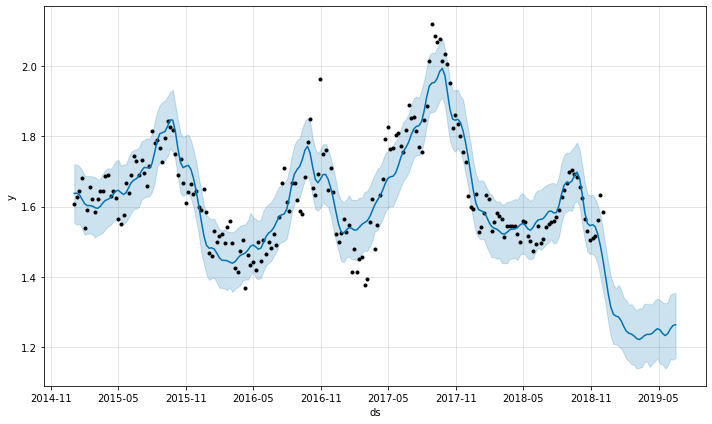

In [65]:
# forecast visualisation
forecast_org_P_def = model_org_P_def.predict(future_org_P_def)
fig_org_P_def = model_org_P_def.plot(forecast_org_P_def)

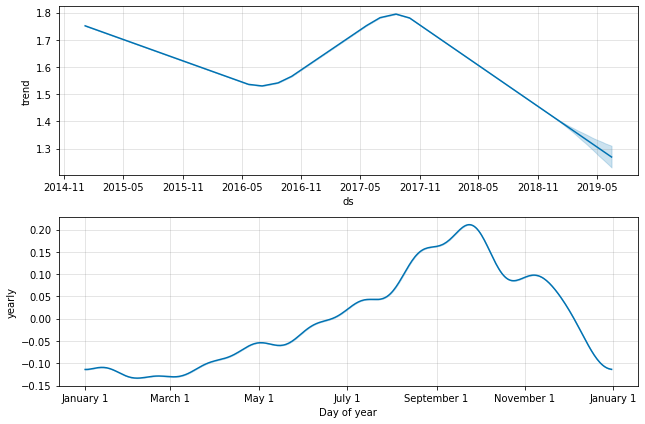

In [66]:
# model components visualisation
fig_org_P_comp_def = model_org_P_def.plot_components(forecast_org_P_def)

In [67]:
# selecting only the test period forecast
pred_org_P_2019_def = forecast_org_P_def[forecast_org_P_def["ds"]>"2019-01-01"][["ds", "yhat"]]

In [68]:
# simplifing the actuals dataframe for comparison
actuals_org_P_2019_def = prices_US_org_2019[["Date", "AveragePrice"]]
actuals_org_P_2019_def.columns = ["ds", "y"]

In [69]:
# merging the prediction and actuals dataframes into one
org_P_2019_def = actuals_org_P_2019_def.merge(pred_org_P_2019_def, on="ds")

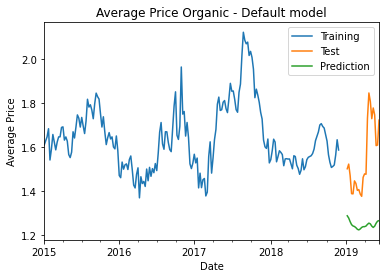

In [70]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=org_P_df, test_pred_dataframe=org_P_2019_def,
                    pred_parameter='Average Price', product_type='Organic', model_type='Default')

In [71]:
# model's MAPE calculation
model_org_P_def_MAPE = mean_absolute_percentage_error(org_P_2019_def["y"], org_P_2019_def["yhat"])

In [72]:
print("Default model MAPE: {:.2f}".format(model_org_P_def_MAPE))

Default model MAPE: 0.19


### Model with hyperparameter tuning

In [73]:
# cross-validation hyperparameters on the Prophet model
param_grid = {  
    "changepoint_prior_scale": [0.001, 0.01, 0.1, 0.5],
    "seasonality_prior_scale": [0.01, 0.1, 1.0, 10.0],
    "seasonality_mode": ["additive", "multiplicative"],
    "growth": ["linear", "flat"],
    "daily_seasonality": [False],
    "weekly_seasonality": [False]
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
mapes = []  # Store the MAPEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(org_P_df)  # Fit model with given params
    df_cv_org_P = cross_validation(m, initial="730 days", period="90 days", horizon="365 days", parallel="processes")
    df_p_org_P = performance_metrics(df_cv_org_P, rolling_window=1)
    mapes.append(df_p_org_P["mape"].values[0])
    
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results["mape"] = mapes
print(tuning_results)

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb627669310>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb628875210>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb627970390>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb626f95cd0>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.proc

    changepoint_prior_scale  seasonality_prior_scale seasonality_mode  growth  \
0                      0.00                     0.01         additive  linear   
1                      0.00                     0.01         additive    flat   
2                      0.00                     0.01   multiplicative  linear   
3                      0.00                     0.01   multiplicative    flat   
4                      0.00                     0.10         additive  linear   
..                      ...                      ...              ...     ...   
59                     0.50                     1.00   multiplicative    flat   
60                     0.50                    10.00         additive  linear   
61                     0.50                    10.00         additive    flat   
62                     0.50                    10.00   multiplicative  linear   
63                     0.50                    10.00   multiplicative    flat   

    daily_seasonality  week

In [74]:
# selecting the best hyperparameters
best_params_org_P = all_params[np.argmin(mapes)]
print(best_params_org_P)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01, 'seasonality_mode': 'additive', 'growth': 'flat', 'daily_seasonality': False, 'weekly_seasonality': False}


In [75]:
# creating the model with the best parameters
model_org_P = Prophet(**best_params_org_P)

In [76]:
# fitting the model on the whole training set
model_org_P.fit(org_P_df)

In [77]:
len(prices_US_org_2019)

28

In [78]:
future_org_P = model_org_P.make_future_dataframe(periods=len(prices_US_org_2019), freq="W")

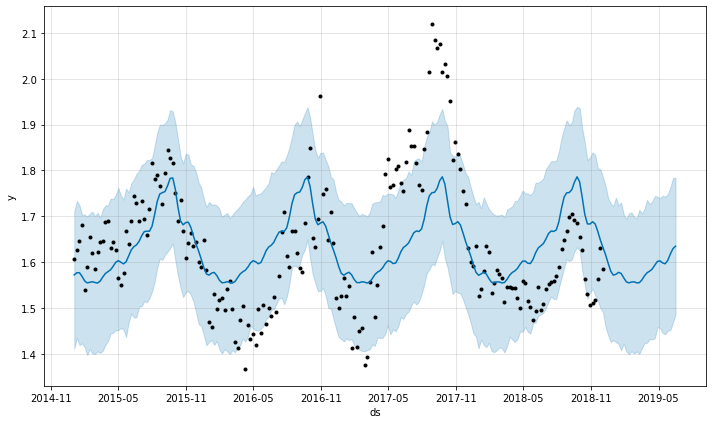

In [79]:
# forecast visualisation
forecast_org_P = model_org_P.predict(future_org_P)
fig_org_P = model_org_P.plot(forecast_org_P)

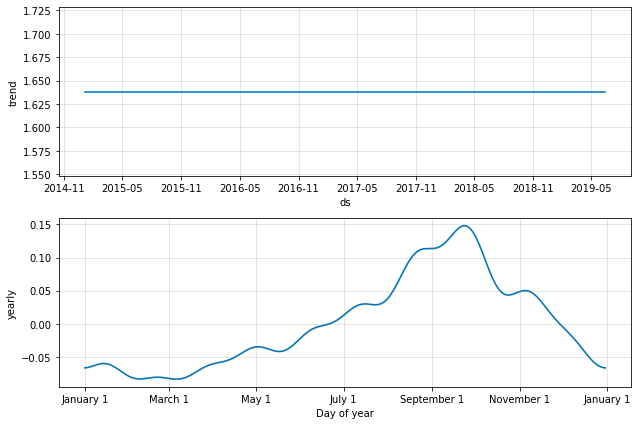

In [80]:
# model components visualisation
fig_org_P_comp = model_org_P.plot_components(forecast_org_P)

In [81]:
# cross-validation of the selected model
df_cv_org_P = cross_validation(model_org_P, initial="730 days", period="90 days", horizon="365 days", parallel="processes")

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb62904c850>


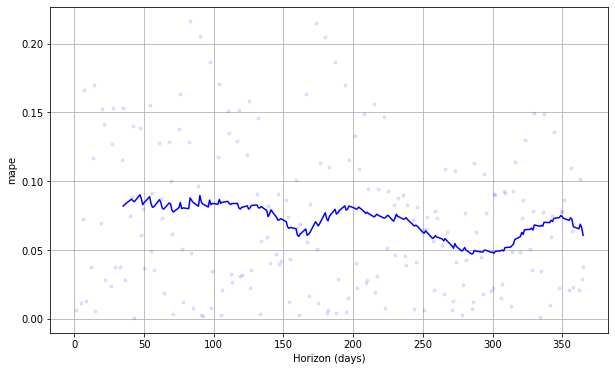

In [82]:
# MAPE of the cross-validated model visualisation
fig_org_P_cv_mape = plot_cross_validation_metric(df_cv_org_P, metric='mape')

In [83]:
# selecting only the test period forecast
pred_org_P_2019 = forecast_org_P[forecast_org_P["ds"]>"2019-01-01"][["ds", "yhat"]]

In [84]:
# simplifing the actuals dataframe for comparison
actuals_org_P_2019 = prices_US_org_2019[["Date", "AveragePrice"]]
actuals_org_P_2019.columns = ["ds", "y"]

In [85]:
# merging the prediction and actuals dataframes into one
org_P_2019 = actuals_org_P_2019.merge(pred_org_P_2019, on="ds")

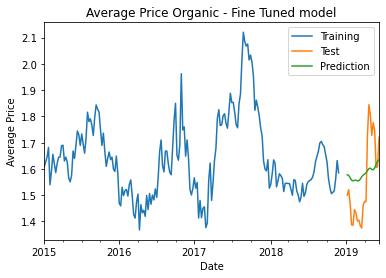

In [86]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=org_P_df, test_pred_dataframe=org_P_2019,
                    pred_parameter='Average Price', product_type='Organic', model_type='Fine Tuned')

In [87]:
# model's MAPE calculation
model_org_P_MAPE = mean_absolute_percentage_error(org_P_2019["y"], org_P_2019["yhat"])

In [88]:
# default vs. tuned models' MAPE
print("Default model MAPE: {:.2f}".format(model_org_P_def_MAPE))
print("Tuned model MAPE: {:.2f}".format(model_org_P_MAPE))

Default model MAPE: 0.19
Tuned model MAPE: 0.08


### Forecasting

In [89]:
# simplifing the full dataset for use by Prophet
org_P_full = prices_US_org_merged[["Date", "AveragePrice"]]
org_P_full.columns = ["ds", "y"]

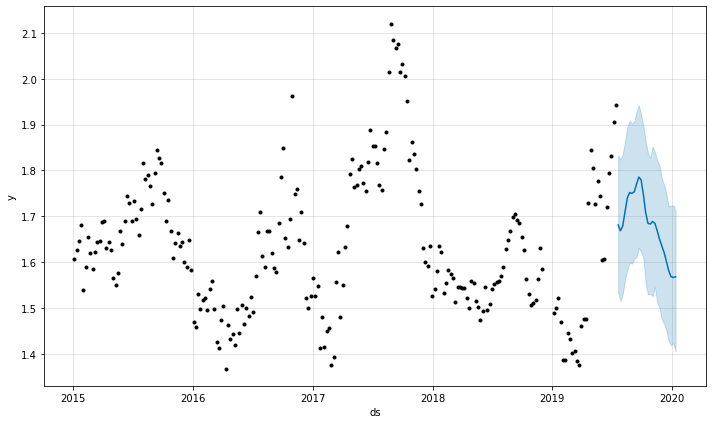

In [90]:
# re-training the model using the best performing parameters and full dataset
# creating 6-month (= 26-week) forecast
model_org_P_for = Prophet(**best_params_org_P)
model_org_P_for.fit(org_P_full)
future_6m_org_P = model_org_P_for.make_future_dataframe(periods=26, freq="W", include_history=False)
forecast_6m_org_P = model_org_P_for.predict(future_6m_org_P)
fig_6m_org_P = model_org_P_for.plot(forecast_6m_org_P)

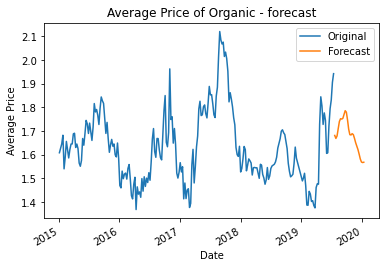

In [91]:
# plotting forecast
plot_forecast(original_dataframe=org_P_full, forecast_dataframe=forecast_6m_org_P,
              pred_parameter='Average Price', product_type='Organic')

## Model for volume of conventional type

In [92]:
# simplifing the dataframe for use by Prophet
conv_Q_df = prices_US_conv_2015_2018[["Date", "TotalVolume"]]
conv_Q_df.columns = ["ds", "y"]

# conv_Q_df["cap"] 

### Default model

In [93]:
# creating model with default values, skipping only the daily and weekly seasonality which isn't present in our data
model_conv_Q_def = Prophet(daily_seasonality=False, weekly_seasonality=False)

In [94]:
# fitting the model on the whole training set
model_conv_Q_def.fit(conv_Q_df)

In [95]:
future_conv_Q_def = model_conv_Q_def.make_future_dataframe(periods=len(prices_US_conv_2019), freq="W")

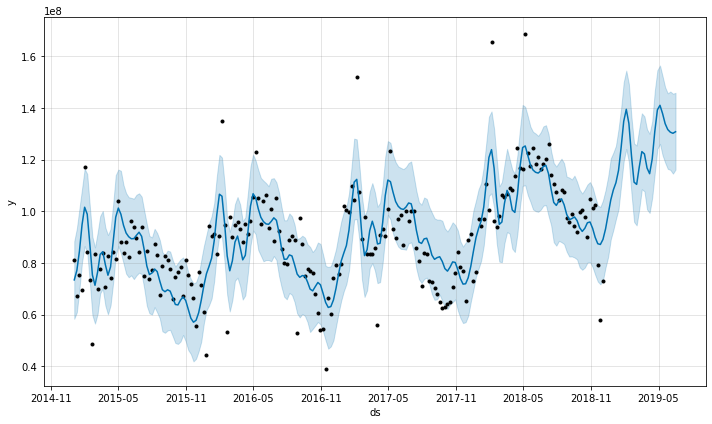

In [96]:
# forecast visualisation
forecast_conv_Q_def = model_conv_Q_def.predict(future_conv_Q_def)
fig_conv_Q_def = model_conv_Q_def.plot(forecast_conv_Q_def)

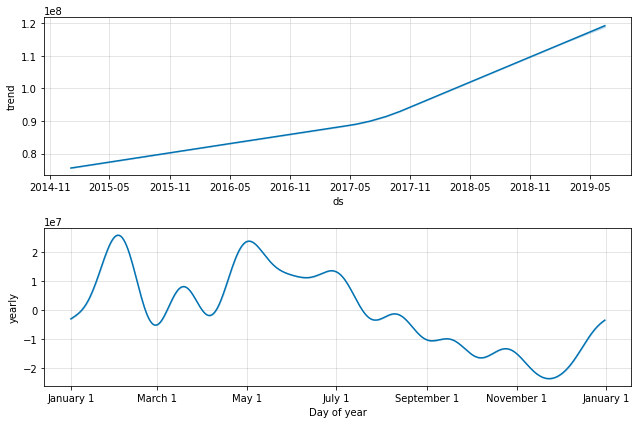

In [97]:
# model components visualisation
fig_conv_Q_comp_def = model_conv_Q_def.plot_components(forecast_conv_Q_def)

In [98]:
# selecting only the test period forecast
pred_conv_Q_2019_def = forecast_conv_Q_def[forecast_conv_Q_def["ds"]>"2019-01-01"][["ds", "yhat"]]

In [99]:
# simplifing the actuals dataframe for comparison
actuals_conv_Q_2019_def = prices_US_conv_2019[["Date", "TotalVolume"]]
actuals_conv_Q_2019_def.columns = ["ds", "y"]

In [100]:
# merging the prediction and actuals dataframes into one
conv_Q_2019_def = actuals_conv_Q_2019_def.merge(pred_conv_Q_2019_def, on="ds")

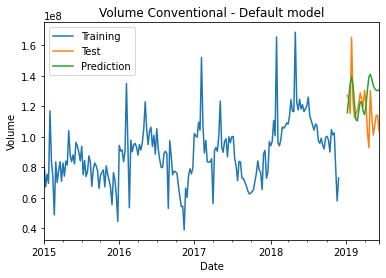

In [101]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=conv_Q_df, test_pred_dataframe=conv_Q_2019_def,
                    pred_parameter='Volume', product_type='Conventional', model_type='Default')

In [102]:
# model's MAPE calculation
model_conv_Q_def_MAPE = mean_absolute_percentage_error(conv_Q_2019_def["y"], conv_Q_2019_def["yhat"])

In [103]:
print("Default model MAPE: {:.2f}".format(model_conv_Q_def_MAPE))

Default model MAPE: 0.13


### Model with hyperparameter tuning

In [104]:
# cross-validation hyperparameters on the Prophet model
param_grid = {  
    "changepoint_prior_scale": [0.001, 0.01, 0.1, 0.5],
    "seasonality_prior_scale": [0.01, 0.1, 1.0, 10.0],
    "growth": ["linear", "flat"], # "logistic" might be better for this model but we'd need the cap value estimate from the client
    "seasonality_mode": ["additive", "multiplicative"],
    "daily_seasonality": [False],
    "weekly_seasonality": [False]
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
mapes = []  # Store the MAPEs for each params here

# Use cross validation to evaluate all parameters

for params in all_params:
    m = Prophet(**params).fit(conv_Q_df)  # Fit model with given params
    df_cv_conv_Q = cross_validation(m, initial="730 days", period="90 days", horizon="365 days", parallel="processes")
    df_p_conv_Q = performance_metrics(df_cv_conv_Q, rolling_window=1)
    mapes.append(df_p_conv_Q["mape"].values[0])
    
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results["mape"] = mapes
print(tuning_results)

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb628c45290>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb60acb0590>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb623499910>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb626c46810>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.proc

    changepoint_prior_scale  seasonality_prior_scale  growth seasonality_mode  \
0                      0.00                     0.01  linear         additive   
1                      0.00                     0.01  linear   multiplicative   
2                      0.00                     0.01    flat         additive   
3                      0.00                     0.01    flat   multiplicative   
4                      0.00                     0.10  linear         additive   
..                      ...                      ...     ...              ...   
59                     0.50                     1.00    flat   multiplicative   
60                     0.50                    10.00  linear         additive   
61                     0.50                    10.00  linear   multiplicative   
62                     0.50                    10.00    flat         additive   
63                     0.50                    10.00    flat   multiplicative   

    daily_seasonality  week

In [105]:
# selecting the best hyperparameters
best_params_conv_Q = all_params[np.argmin(mapes)]
print(best_params_conv_Q)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0, 'growth': 'linear', 'seasonality_mode': 'multiplicative', 'daily_seasonality': False, 'weekly_seasonality': False}


In [106]:
# creating the model with the best parameters
model_conv_Q = Prophet(**best_params_conv_Q)

In [107]:
# fitting the model on the whole training set
model_conv_Q.fit(conv_Q_df)

In [108]:
future_conv_Q = model_conv_Q.make_future_dataframe(periods=len(prices_US_conv_2019), freq="W")

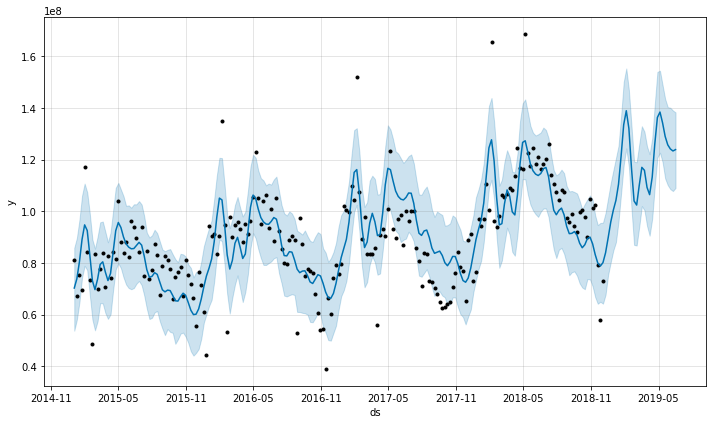

In [109]:
# forecast visualisation
forecast_conv_Q = model_conv_Q.predict(future_conv_Q)
fig_conv_Q = model_conv_Q.plot(forecast_conv_Q)

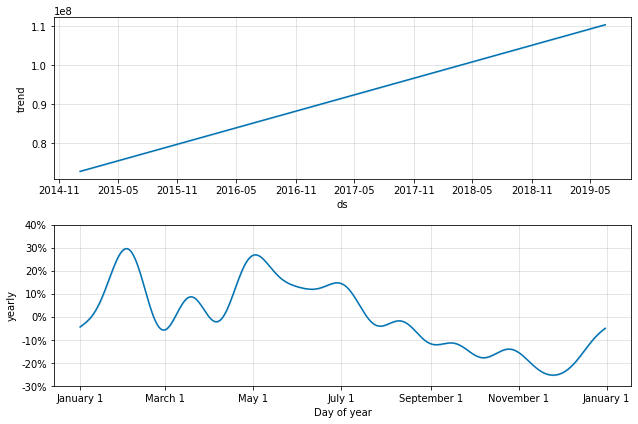

In [110]:
# model components visualisation
fig_conv_Q_comp = model_conv_Q.plot_components(forecast_conv_Q)

In [111]:
# cross-validation of the selected model
df_cv_conv_Q = cross_validation(model_conv_Q, initial="730 days", period="90 days", horizon="365 days", parallel="processes")

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb627694a10>


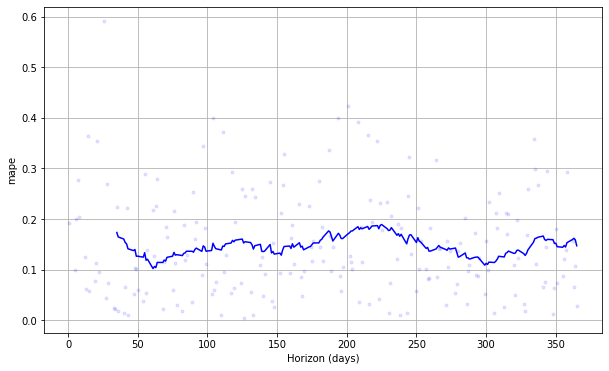

In [112]:
# MAPE of the cross-validated model visualisation
fig_conv_Q_cv_mape = plot_cross_validation_metric(df_cv_conv_Q, metric='mape')

In [113]:
# selecting only the test period forecast
pred_conv_Q_2019 = forecast_conv_Q[forecast_conv_Q["ds"]>"2019-01-01"][["ds", "yhat"]]

In [114]:
# simplifing the actuals dataframe for comparison
actuals_conv_Q_2019 = prices_US_conv_2019[["Date", "TotalVolume"]]
actuals_conv_Q_2019.columns = ["ds", "y"]

In [115]:
# merging the prediction and actuals dataframes into one
conv_Q_2019 = actuals_conv_Q_2019.merge(pred_conv_Q_2019, on="ds")

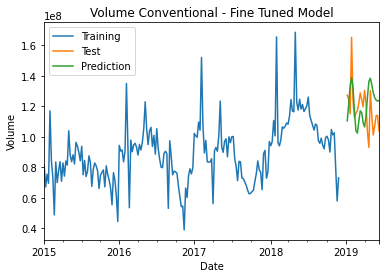

In [116]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=conv_Q_df, test_pred_dataframe=conv_Q_2019,
                    pred_parameter='Volume', product_type='Conventional', model_type='Fine Tuned')

In [117]:
# model's MAPE calculation
model_conv_Q_MAPE = mean_absolute_percentage_error(conv_Q_2019["y"], conv_Q_2019["yhat"])

In [118]:
# default vs. tuned models' MAPE
print("Default model MAPE: {:.2f}".format(model_conv_Q_def_MAPE))
print("Tuned model MAPE: {:.2f}".format(model_conv_Q_MAPE))

Default model MAPE: 0.13
Tuned model MAPE: 0.14


### Forecasting

In [119]:
# simplifing the full dataset for use by Prophet
conv_Q_full = prices_US_conv_merged[["Date", "TotalVolume"]]
conv_Q_full.columns = ["ds", "y"]

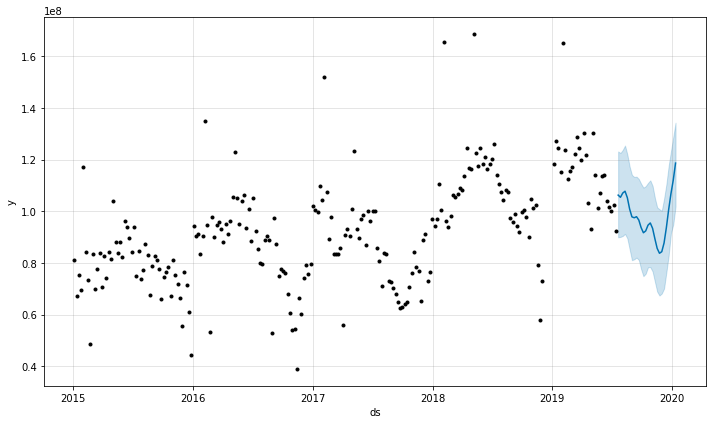

In [120]:
# re-training the model using the best performing parameters and full dataset
# creating 6-month (= 26-week) forecast
model_conv_Q_for = Prophet(**best_params_conv_Q)
model_conv_Q_for.fit(conv_Q_full)
future_6m_conv_Q = model_conv_Q_for.make_future_dataframe(periods=26, freq="W", include_history=False)
forecast_6m_conv_Q = model_conv_Q_for.predict(future_6m_conv_Q)
fig_6m_conv_Q = model_conv_Q_for.plot(forecast_6m_conv_Q)

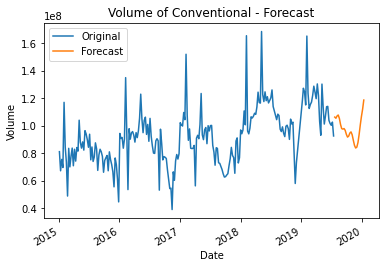

In [121]:
# plotting forecast
plot_forecast(original_dataframe=conv_Q_full, forecast_dataframe=forecast_6m_conv_Q,
              pred_parameter='Volume', product_type='Conventional')

## Model for volume of organic type

In [122]:
# simplifing the dataframe for use by Prophet
org_Q_df = prices_US_org_2015_2018[["Date", "TotalVolume"]]
org_Q_df.columns = ["ds", "y"]

# org_Q_df["cap"] 

### Default model

In [123]:
# creating model with default values, skipping only the daily and weekly seasonality which isn't present in our data
model_org_Q_def = Prophet(daily_seasonality=False, weekly_seasonality=False)

In [124]:
# fitting the model on the whole training set
model_org_Q_def.fit(org_Q_df)

In [125]:
future_org_Q_def = model_org_Q_def.make_future_dataframe(periods=len(prices_US_org_2019), freq="W")

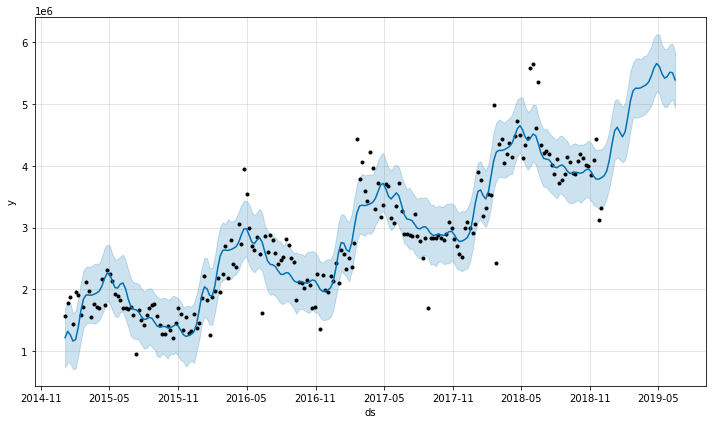

In [126]:
# forecast visualisation
forecast_org_Q_def = model_org_Q_def.predict(future_org_Q_def)
fig_org_Q_def = model_org_Q_def.plot(forecast_org_Q_def)

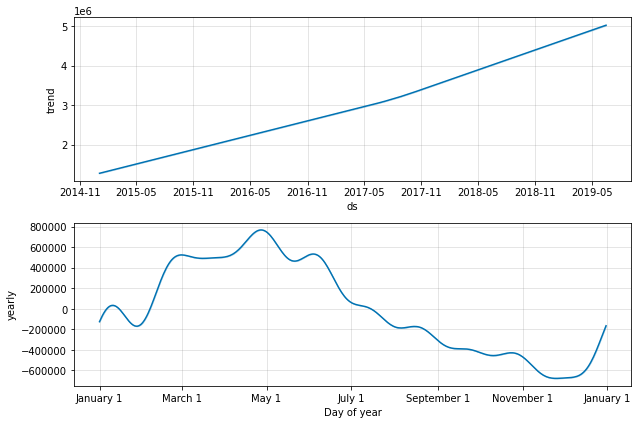

In [127]:
# model components visualisation
fig_org_Q_comp_def = model_org_Q_def.plot_components(forecast_org_Q_def)

In [128]:
# selecting only the test period forecast
pred_org_Q_2019_def = forecast_org_Q_def[forecast_org_Q_def["ds"]>"2019-01-01"][["ds", "yhat"]]

In [129]:
# simplifing the actuals dataframe for comparison
actuals_org_Q_2019_def = prices_US_org_2019[["Date", "TotalVolume"]]
actuals_org_Q_2019_def.columns = ["ds", "y"]

In [130]:
# merging the prediction and actuals dataframes into one
org_Q_2019_def = actuals_org_Q_2019_def.merge(pred_org_Q_2019_def, on="ds")

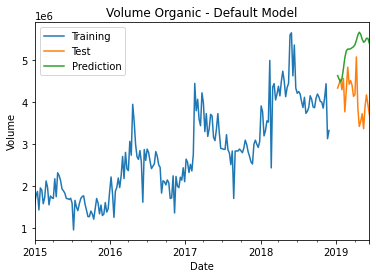

In [131]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=org_Q_df, test_pred_dataframe=org_Q_2019_def,
                    pred_parameter='Volume', product_type='Organic', model_type='Default')

In [132]:
# model's MAPE calculation
model_org_Q_def_MAPE = mean_absolute_percentage_error(org_Q_2019_def["y"], org_Q_2019_def["yhat"])

In [133]:
print("Default model MAPE: {:.2f}".format(model_org_Q_def_MAPE))

Default model MAPE: 0.28


### Model with hyperparameter tuning

In [134]:
# cross-validation hyperparameters on the Prophet model
param_grid = {  
    "changepoint_prior_scale": [0.001, 0.01, 0.1, 0.5],
    "seasonality_prior_scale": [0.01, 0.1, 1.0, 10.0],
    "growth": ["linear", "flat"], # "logistic" might be better for this model but we'd need the cap value estimate from the client
    "seasonality_mode": ["additive", "multiplicative"],
    "daily_seasonality": [False],
    "weekly_seasonality": [False]
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
mapes = []  # Store the MAPEs for each params here

# Use cross validation to evaluate all parameters

for params in all_params:
    m = Prophet(**params).fit(org_Q_df)  # Fit model with given params
    df_cv_org_Q = cross_validation(m, initial="730 days", period="90 days", horizon="365 days", parallel="processes")
    df_p_org_Q = performance_metrics(df_cv_org_Q, rolling_window=1)
    mapes.append(df_p_org_Q["mape"].values[0])
    
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results["mape"] = mapes
print(tuning_results)

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb628875a90>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb60b2548d0>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb628c28e10>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb628c28e10>
INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.proc

    changepoint_prior_scale  seasonality_prior_scale  growth seasonality_mode  \
0                      0.00                     0.01  linear         additive   
1                      0.00                     0.01  linear   multiplicative   
2                      0.00                     0.01    flat         additive   
3                      0.00                     0.01    flat   multiplicative   
4                      0.00                     0.10  linear         additive   
..                      ...                      ...     ...              ...   
59                     0.50                     1.00    flat   multiplicative   
60                     0.50                    10.00  linear         additive   
61                     0.50                    10.00  linear   multiplicative   
62                     0.50                    10.00    flat         additive   
63                     0.50                    10.00    flat   multiplicative   

    daily_seasonality  week

In [135]:
# selecting the best hyperparameters
best_params_org_Q = all_params[np.argmin(mapes)]
print(best_params_org_Q)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0, 'growth': 'linear', 'seasonality_mode': 'additive', 'daily_seasonality': False, 'weekly_seasonality': False}


In [136]:
# creating the model with the best parameters
model_org_Q = Prophet(**best_params_org_Q)

In [137]:
# fitting the model on the whole training set
model_org_Q.fit(org_Q_df)

In [138]:
future_org_Q = model_org_Q.make_future_dataframe(periods=len(prices_US_org_2019), freq="W")

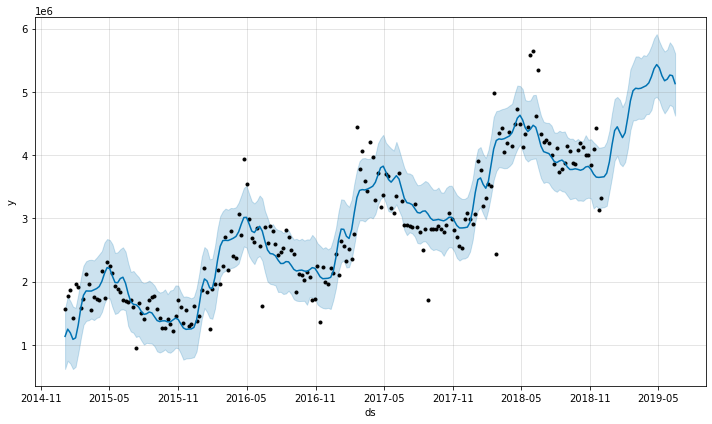

In [139]:
# forecast visualisation
forecast_org_Q = model_org_Q.predict(future_org_Q)
fig_org_Q = model_org_Q.plot(forecast_org_Q)

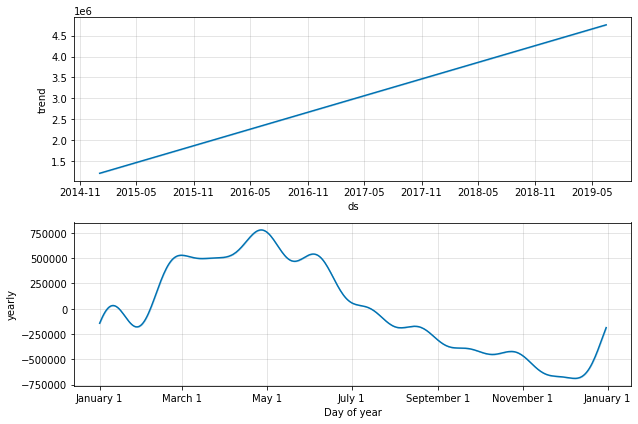

In [140]:
# model components visualisation
fig_org_Q_comp = model_org_Q.plot_components(forecast_org_Q)

In [141]:
# cross-validation of the selected model
df_cv_org_Q = cross_validation(model_org_Q, initial="730 days", period="90 days", horizon="365 days", parallel="processes")

INFO:prophet:Making 4 forecasts with cutoffs between 2017-03-07 00:00:00 and 2017-12-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fb60d606750>


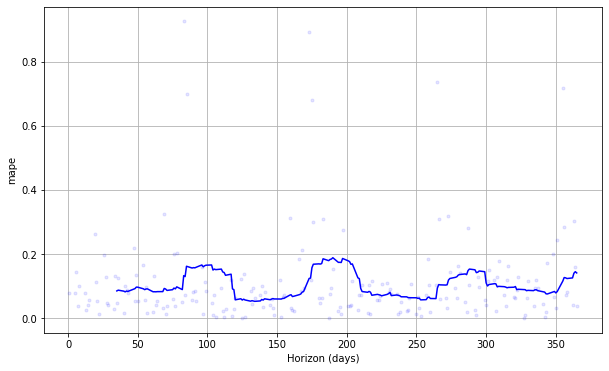

In [142]:
# MAPE of the cross-validated model visualisation
fig_org_Q_cv_mape = plot_cross_validation_metric(df_cv_org_Q, metric='mape')

In [143]:
# selecting only the test period forecast
pred_org_Q_2019 = forecast_org_Q[forecast_org_Q["ds"]>"2019-01-01"][["ds", "yhat"]]

In [144]:
# simplifing the actuals dataframe for comparison
actuals_org_Q_2019 = prices_US_org_2019[["Date", "TotalVolume"]]
actuals_org_Q_2019.columns = ["ds", "y"]

In [145]:
# merging the prediction and actuals dataframes into one
org_Q_2019 = actuals_org_Q_2019.merge(pred_org_Q_2019, on="ds")

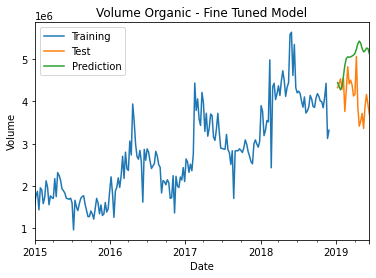

In [146]:
# plotting training, test and prediction data
plot_train_test_pred(training_dataframe=org_Q_df, test_pred_dataframe=org_Q_2019,
                    pred_parameter='Volume', product_type='Organic', model_type='Fine Tuned')

In [147]:
# model's MAPE calculation
model_org_Q_MAPE = mean_absolute_percentage_error(org_Q_2019["y"], org_Q_2019["yhat"])

In [148]:
# default vs. tuned models' MAPE
print("Default model MAPE: {:.2f}".format(model_org_Q_def_MAPE))
print("Tuned model MAPE: {:.2f}".format(model_org_Q_MAPE))

Default model MAPE: 0.28
Tuned model MAPE: 0.23


### Forecasting

In [149]:
# simplifing the full dataset for use by Prophet
org_Q_full = prices_US_org_merged[["Date", "TotalVolume"]]
org_Q_full.columns = ["ds", "y"]

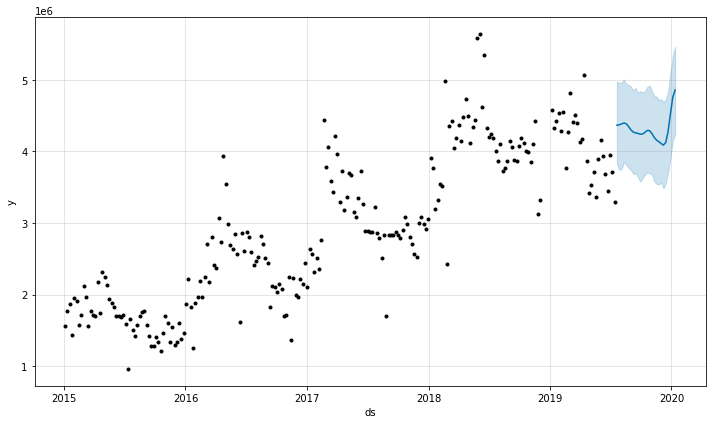

In [150]:
# re-training the model using the best performing parameters and full dataset
# creating 6-month (= 26-week) forecast
model_org_Q_for = Prophet(**best_params_org_Q)
model_org_Q_for.fit(org_Q_full)
future_6m_org_Q = model_org_Q_for.make_future_dataframe(periods=26, freq="W", include_history=False)
forecast_6m_org_Q = model_org_Q_for.predict(future_6m_org_Q)
fig_6m_org_Q = model_org_Q_for.plot(forecast_6m_org_Q)

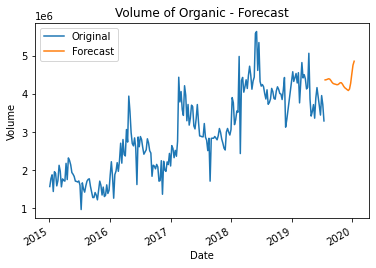

In [151]:
# plotting forecast
plot_forecast(original_dataframe=org_Q_full, forecast_dataframe=forecast_6m_org_Q,
              pred_parameter='Volume', product_type='Organic')